<a href="https://colab.research.google.com/github/MVVENTO/Machine-Learning/blob/main/StreetEndDetector_working.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## **Street ends** - Custom DataSet 

https://colab.research.google.com/github/roboflow-ai/yolov5-custom-training-tutorial/blob/main/yolov5-custom-training.ipynb#scrollTo=7iiObB2WCMh6

Note: Increased testing on half of dataset images, added more aumentation and annotated carefully. (excluding cars, trees, other objects that might obstruct views) 

**Streetlight dataset** 

In [1]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="d6XLvYat4sv7cDuJOcZM")
project = rf.workspace("opal_v").project("street-end-dot-v2")
dataset = project.version(1).download("yolov5")

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.0/49.0 KB 732.2 kB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 KB 2.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 140.6/140.6 KB 4.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 KB 3.6 MB/s eta 0:00:00
  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9674 sha256=1706f758f20f93e3197180856bec2b1efe519e2e665d3aa2ae4f07a3ce04b199
  Stored in directory: /root/.cache/pip/wheels/bd/a8/c3/3cf2c14a1837a4e04bd98631724e81f33f462d86a1d895fae0
Successfully built wget
  Attempting uninstall: urllib3
    Found existing installation: urllib3 1.24.3
    Uninstalling urllib3-1.24.3:
      Successfully uninstalled urllib3-1.24.3
  Attempting uninstall: pyparsing
    Found existing installation: pyparsing 3.0.9
    Uninstalling pypar

loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to Street-End-DOT-v2-1 in yolov5pytorch:: 100%|██████████| 340/340 [00:00<00:00, 1641.48it/s]


Setup and Install

In [2]:
#clone YOLOv5 and 
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
%pip install -qr requirements.txt #install dependencies
%pip install -q roboflow

import torch
import os
from IPython.display import Image, clear_output # to display images

Cloning into 'yolov5'...
remote: Enumerating objects: 15002, done.
remote: Total 15002 (delta 0), reused 0 (delta 0), pack-reused 15002
Receiving objects: 100% (15002/15002), 14.08 MiB | 18.77 MiB/s, done.
Resolving deltas: 100% (10291/10291), done.
/content/yolov5
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 184.0/184.0 KB 13.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 KB 9.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 76.4 MB/s eta 0:00:00


In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
from roboflow import Roboflow
rf = Roboflow(model_format="yolov5", notebook="ultralytics")

upload and label your dataset, and get an API KEY here: https://app.roboflow.com/?model=yolov5&ref=ultralytics


Set Up

In [5]:
# set up environment
os.environ["DATASET_DIRECTORY"] = "/content/datasets"

Get Dataset from Roboflow

In [6]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="d6XLvYat4sv7cDuJOcZM")
project = rf.workspace("opal_v").project("street-end-dot-v2")
dataset = project.version(1).download("yolov5")

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to /content/datasets/Street-End-DOT-v2-1 in yolov5pytorch:: 100%|██████████| 340/340 [00:00<00:00, 865.63it/s]


Train The Yolo Model

In [7]:
!python train.py --img 416 --batch 16 --epochs 100 --data {dataset.location}/data.yaml --weights yolov5s.pt --cache

train: weights=yolov5s.pt, cfg=, data=/content/datasets/Street-End-DOT-v2-1/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=100, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v7.0-72-g064365d Python-3.8.10 torch-1.13.1+cu116 CUDA:0 (Tesla T4, 15110MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, 

Show Training results


In [8]:
# Start tensorboard 
# Launch after you have started training 
# logs save in the folder "runs
%load_ext tensorboard
%tensorboard --logdir runs 

<IPython.core.display.Javascript object>

Prediction

In [9]:
!python detect.py --weights runs/train/exp/weights/best.pt --img 416 --conf 0.1 --source {dataset.location}/valid/images 

detect: weights=['runs/train/exp/weights/best.pt'], source=/content/datasets/Street-End-DOT-v2-1/valid/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-72-g064365d Python-3.8.10 torch-1.13.1+cu116 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
image 1/20 /content/datasets/Street-End-DOT-v2-1/valid/images/DJI_20220316132122_0001_JPG.rf.7458e8a694bdd984d20bcf17094f4f24.jpg: 416x416 1 street-ends, 7.9ms
image 2/20 /content/datasets/Street-End-DOT-v2-1/valid/images/DJI_20220316132138_0003_JPG.rf.f24d98c2cb0ec09225bc7c52ef85bc68.jpg: 416x416 1 street-ends, 8.0



```
# This is formatted as code
```

Display 
interface 
images

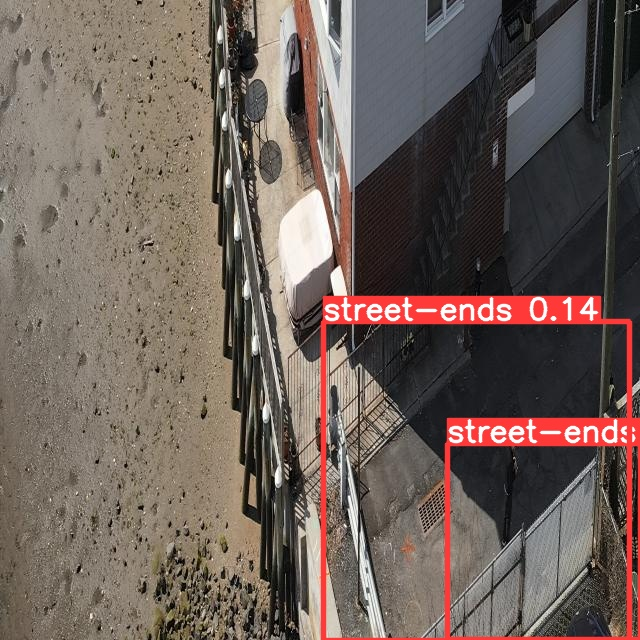

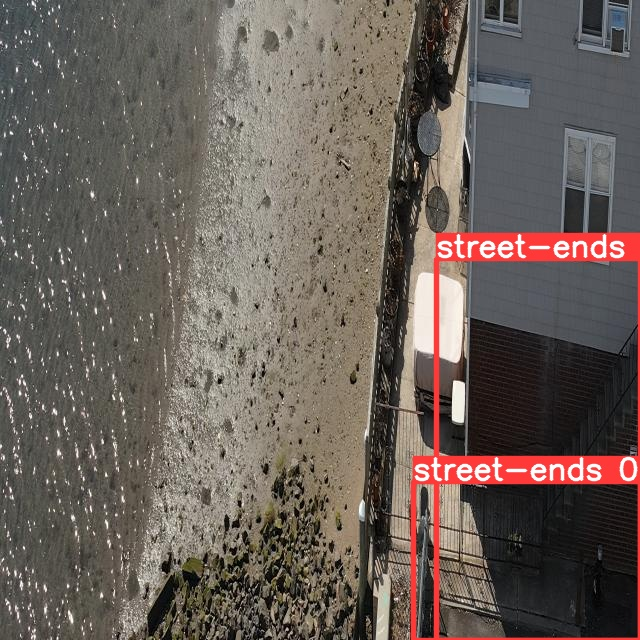

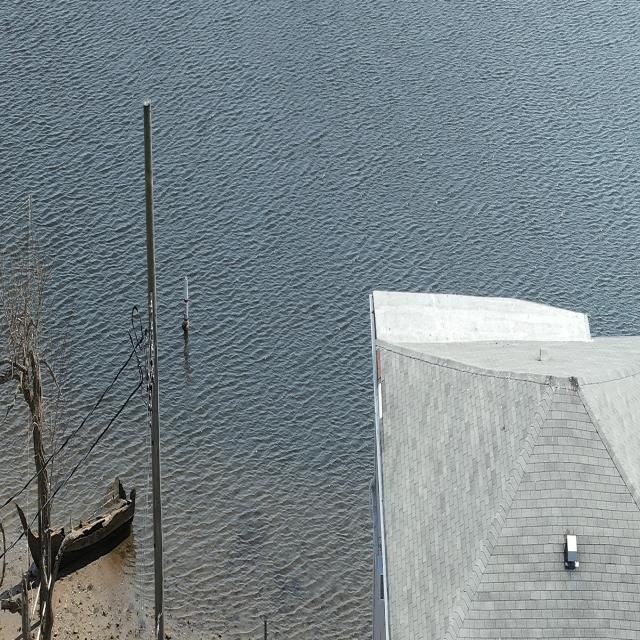

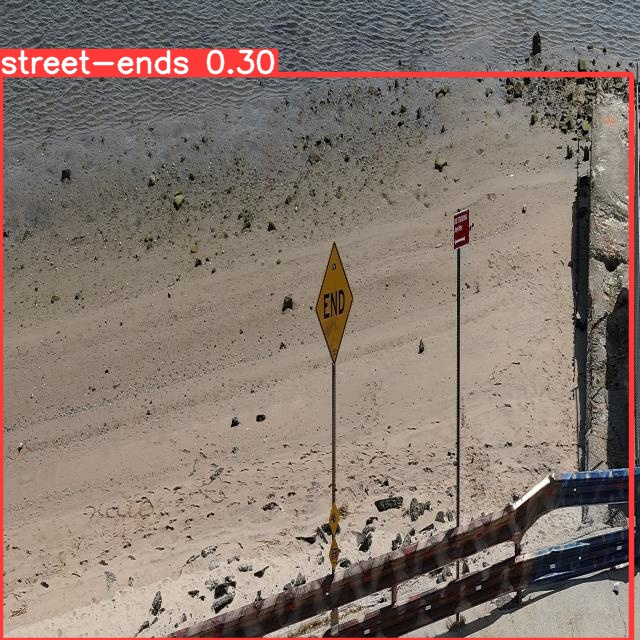

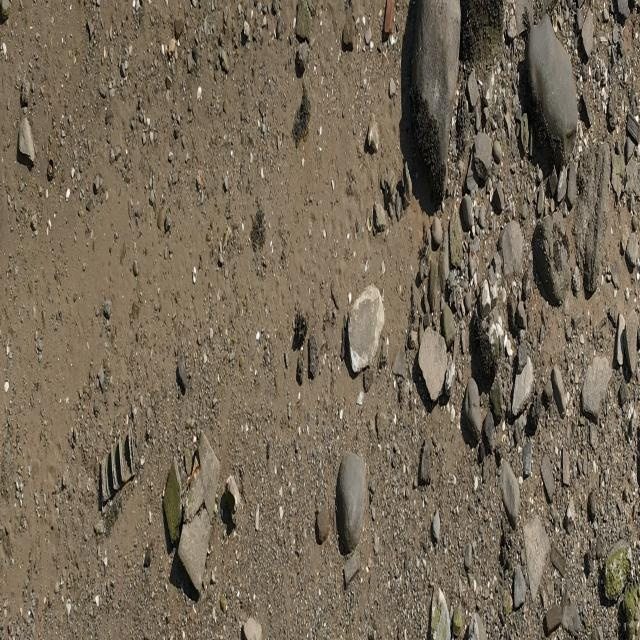

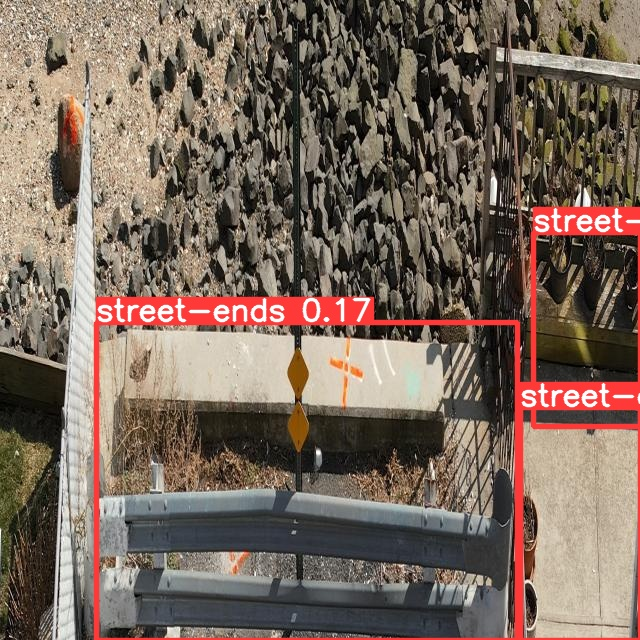

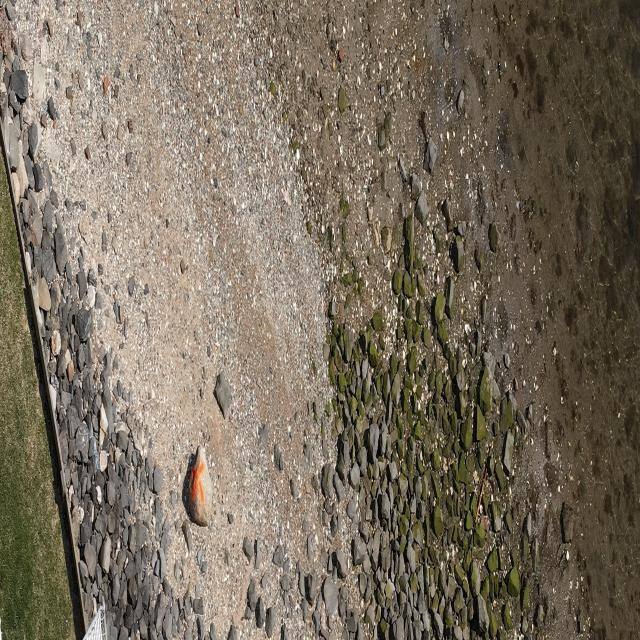

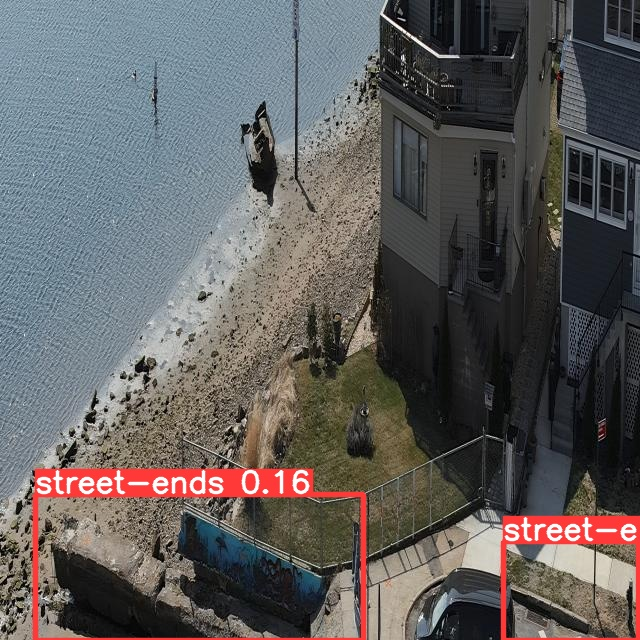

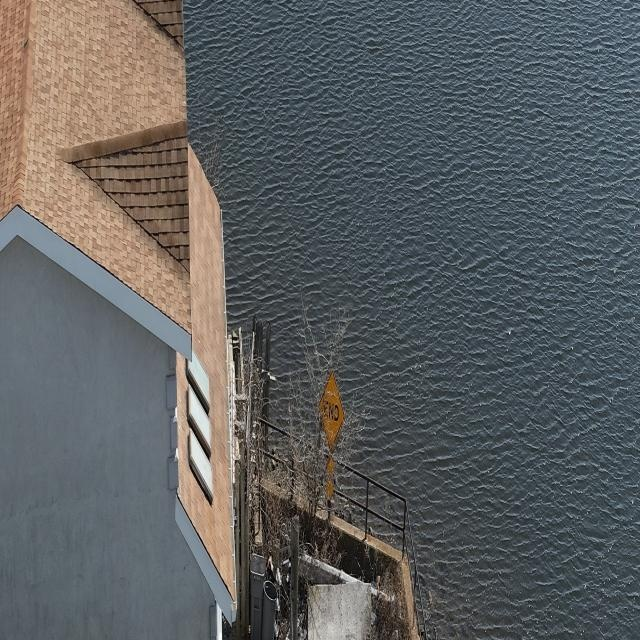

In [10]:
# display interface on ALL test images

import glob
from IPython.display import Image, display

i = 0
# Choose the correct exp folder - see prev output block
for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'): # assuming JPG
  i += 1 

  if i < 10:
    display(Image(filename=imageName))
    print("\n")